# PROJECT : RestauIQ Data Analysis

In [1]:
!pip3 install warnings

ERROR: Could not find a version that satisfies the requirement warnings (from versions: none)
ERROR: No matching distribution found for warnings


In [2]:
import warnings
warnings.simplefilter("ignore")

In [3]:
import pyodbc
import matplotlib.pyplot as plt
import pandas as pd

# Set up the connection string for Windows Authentication
conn = pyodbc.connect(
    'DRIVER={ODBC Driver 17 for SQL Server};'
    'SERVER=YUVICHAUHAN\SQLEXPRESS;'
    'DATABASE=namastesql;'
    'Trusted_Connection=yes;'
)
cursor = conn.cursor()


In [4]:
var1=pd.read_csv(r"C:\Users\Yogesh\Downloads\new_Dataset.csv")

In [5]:
var1

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,...,Currency,Has_Table_booking,Has_Online_delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [6]:
var1.head(2)

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,...,Currency,Has_Table_booking,Has_Online_delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591


#                                                                                  LEVEL : 1

# TASK 1
# 1.Determine the top three most common cuisines in the dataset.
# 2.Calculate the percentage of restaurants that serve each of the top cuisines.

In [7]:
#Determine the top three most common cuisines in the dataset.
query="select top 3 Cuisines , count(Cuisines)  as cnt from data_ana group by Cuisines order by cnt desc"
var=pd.read_sql(query,conn)
var


,Cuisines,cnt
0,North Indian,936
1,"North Indian, Chinese",511
2,Chinese,354


In [8]:
#Calculate the percentage of restaurants that serve each of the top cuisines.
query="select top 3 Cuisines , concat(count(Cuisines)*100/(SELECT count(*) from data_ana),'%') as cnt  from data_ana group by Cuisines order by cnt desc"
var=pd.read_sql(query,conn)
var

,Cuisines,cnt
0,North Indian,9%
1,"North Indian, Chinese",5%
2,Cafe,3%


# TASK 2
# 1.Identify the city with the highest number of restaurants in the dataset.
# 2.Calculate the average rating for restaurants in each city.
# 3.Determine the city with the highest average rating.

In [9]:
#Identify the city with the highest number of restaurants in the dataset.
query1="select top 10 City  from (select City, count(Restaurant_Name) as restaurant_cnt  from data_ana group  by City)a order by  restaurant_cnt desc"
var1=pd.read_sql(query1,conn)
var1


,City
0,New Delhi
1,Gurgaon
2,Noida
3,Faridabad
4,Ghaziabad
5,Bhubaneshwar
6,Ahmedabad
7,Amritsar
8,Guwahati
9,Lucknow


In [10]:
#Calculate the average rating for restaurants in each city.
query=("select City,round(sum(Aggregate_rating)/count(*),2) as avg_rating  from data_Ana group by City")
var=pd.read_sql(query,conn)
var

,City,avg_rating
0,New Delhi,2.44
1,Mohali,4.30
2,Pretoria,4.19
3,Forrest,3.70
4,Bhubaneshwar,3.98
...,...,...
136,Agra,3.96
137,Sioux City,3.77
138,Savannah,4.16
139,Rest of Hawaii,4.41


In [11]:
#Determine the city with the highest average rating.
query=("select top 10 City,round(sum(Aggregate_rating)/count(*),2) as avg_rating  from data_Ana group by City order by avg_rating desc")
var=pd.read_sql(query,conn)
var

,City,avg_rating
0,Inner City,4.90
1,Quezon City,4.80
2,Makati City,4.65
3,Pasig City,4.63
4,Mandaluyong City,4.63
5,Beechworth,4.60
6,Taguig City,4.53
7,London,4.53
8,Tagaytay City,4.50
9,Secunderabad,4.50


# TASK 3 
# 1.Calculate the percentage of restaurants in each price range category.
# 2.Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants.

In [12]:

#Calculate the percentage of restaurants in each price range category.
query=("select concat(round((Price_range/(select count(*) from data_ana))*100,4),'%') as restaurant_percent FROM data_ana")
var=pd.read_sql(query,conn)
var

,restaurant_percent
0,0.0209%
1,0.0105%
2,0.0105%
3,0.0105%
4,0.0209%
...,...
9546,0.0209%
9547,0.0209%
9548,0.0209%
9549,0.0105%


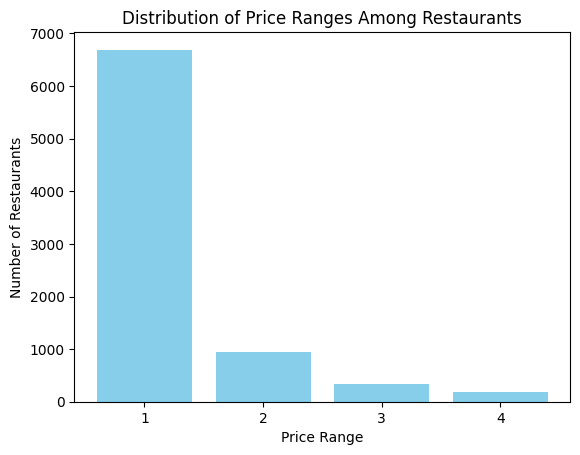

6691 948 330 176


In [ ]:
#Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants.

import matplotlib.pyplot as plt

query = '''
SELECT 
    SUM(CASE WHEN cnt = 1 THEN cnt ELSE 0 END) AS cnt_1,
    SUM(CASE WHEN cnt = 2 THEN cnt ELSE 0 END) AS cnt_2,
    SUM(CASE WHEN cnt = 3 THEN cnt ELSE 0 END) AS cnt_3,
    SUM(CASE WHEN cnt = 4 THEN cnt ELSE 0 END) AS cnt_4
FROM 
    (SELECT COUNT(Restaurant_Name) AS cnt 
     FROM data_ana
     GROUP BY Restaurant_Name) a;
'''

cursor.execute(query)
row = cursor.fetchone()
# Retrieve the counts
counts = [row.cnt_1, row.cnt_2, row.cnt_3, row.cnt_4]

# Visualize the results
price_ranges = ['1','2','3','4']

# Creating a bar chart
plt.bar(price_ranges, counts, color='skyblue')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.show()

print(row.cnt_1, row.cnt_2, row.cnt_3, row.cnt_4)


# TASK 4
# 1.Determine the percentage of restaurants that offer online delivery.
# 2.Compare the average ratings of restaurants with and without online delivery.

In [14]:
#Determine the percentage of restaurants that offer online delivery.
query="select concat(online_cnt*100/(select count(*) from data_ana),'%')PERCENTAGE_of_restaurants from(select count(Has_Online_delivery)online_cnt from data_ana where Has_Online_delivery ='Yes')a"
var=pd.read_sql(query,conn)
var

,PERCENTAGE_of_restaurants
0,25%


In [15]:
#Compare the average ratings of restaurants with and without online delivery.
query="select count(Has_Online_delivery) as online_cnt from data_ana where Has_Online_delivery ='Yes'" 
var=pd.read_sql(query,conn)
var


,online_cnt
0,2451


In [16]:
query1="select count(Has_Online_delivery) as offline_cnt from data_ana where Has_Online_delivery ='No'"
var=pd.read_sql(query1,conn)
var

,offline_cnt
0,7100


# LEVEL : 2 

# TASK 1
# 1.Analyze the distribution of aggregate ratings and determine the most common rating range.
# 2.Calculate the average number of votes received by restaurants.


In [17]:
#Analyze the distribution of aggregate ratings and determine the most common rating range.
query="SELECT Aggregate_rating, count(Aggregate_rating) as rating_range  from data_ana group by Aggregate_rating order by count(Aggregate_rating) desc"
var=pd.read_sql(query,conn)
var

,Aggregate_rating,rating_range
0,0.0,2148
1,3.2,522
2,3.1,519
3,3.4,498
4,3.3,483
5,3.5,480
6,3.0,468
7,3.6,458
8,3.7,427
9,3.8,400


In [18]:
#Calculate the average number of votes received by restaurants.
query="select sum(Votes)/(select count(*) from data_ana) as avg_number_of_votes from data_ana where Votes>0"
var=pd.read_sql(query,conn)
var

,avg_number_of_votes
0,156.909748


# TASK 2 
# 1.Identify the most common combinations of cuisines in the dataset.
# 2.Determine if certain cuisine combinations tend to have higher ratings.

In [19]:
#Identify the most common combinations of cuisines in the dataset.
query="select Cuisines , count(Cuisines)  as cnt from data_ana group by Cuisines order by cnt desc"
var=pd.read_sql(query,conn)
var

,Cuisines,cnt
0,North Indian,936
1,"North Indian, Chinese",511
2,Chinese,354
3,Fast Food,354
4,"North Indian, Mughlai",334
...,...,...
1821,"European, Pizza",1
1822,"South Indian, North Indian, Fast Food",1
1823,"American, Breakfast, Desserts",1
1824,"American, Cafe",1


In [20]:
#Determine if certain cuisine combinations tend to have higher ratings.
query="select top 10 Cuisines, max(Aggregate_rating)  as higher_rating from data_ana group by Cuisines,Aggregate_rating order by higher_rating desc"
var=pd.read_sql(query,conn)
var

,Cuisines,higher_rating
0,"American, BBQ, Sandwich",4.9
1,"American, Burger, Grill",4.9
2,"American, Caribbean, Seafood",4.9
3,"American, Coffee and Tea",4.9
4,"American, Sandwich, Tea",4.9
5,Asian,4.9
6,"Bakery, Desserts",4.9
7,Bar Food,4.9
8,"BBQ, Breakfast, Southern",4.9
9,"Brazilian, Bar Food",4.9


# TASK 3 
# 1.Plot the locations of restaurants on a map using longitude and latitude coordinates.
# 2.Identify any patterns or clusters of restaurants in specific areas.

In [21]:
%pip install folium



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [22]:

import folium
from IPython.display import display

# Step 1: Fetch the Data
query = "SELECT Restaurant_Name, Latitude, Longitude FROM data_ana;"
df = pd.read_sql(query, conn)

# Step 2: Create a Map Centered at an Initial Location
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=13)

# Step 3: Add Markers for Each Restaurant
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant_Name']).add_to(restaurant_map)

# Step 4: Display the Map in the Jupyter Notebook
display(restaurant_map)


In [23]:
%pip install kmeans

  Using cached kmeans-1.0.2.tar.gz (5.9 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py clean for kmeans
Failed to build kmeans
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [17 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build\lib.win-amd64-cpython-310\kmeans
      copying kmeans\performance.py -> build\lib.win-amd64-cpython-310\kmeans
      copying kmeans\tests.py -> build\lib.win-amd64-cpython-310\kmeans
      copying kmeans\__init__.py -> build\lib.win-amd64-cpython-310\kmeans
      running egg_info
      writing kmeans.egg-info\PKG-INFO
      writing dependency_links to kmeans.egg-info\dependency_links.txt
      writing top-level names to kmeans.egg-info\top_level.txt
      reading manifest file 'kmeans.egg-info\SOURCES.txt'
      writing manifest file 'kmeans.egg-info\SOURCES.txt'
      copying kmeans\lib.c -> build\lib.win-amd64-cpython-310\kmeans
      running build_ext
      building 'kmeans/lib' extension
      error: Microsoft Visual C++ 14.0 or greater is required. Get

In [24]:
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [25]:
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import folium
from sklearn.cluster import KMeans

# TASK 4 
# 1.Identify if there are any restaurant chains present in the dataset.
# 2.Analyze the ratings and popularity of different restaurant chains.

In [27]:
#Identify if there are any restaurant chains present in the dataset.
query=cursor.execute("SELECT Restaurant_Name  FROM (SELECT Restaurant_Name ,COUNT(*) AS location_count FROM  data_ana GROUP BY  Restaurant_Name HAVING COUNT(*) >= 2 )a ORDER BY location_count DESC")
list=[]
for i in query:
    list.append(i)
print(list)    

[('Cafe Coffee Day',), ("Domino's Pizza",), ('Subway',), ('Green Chick Chop',), ("McDonald's",), ('Keventers',), ('Pizza Hut',), ('Giani',), ('Baskin Robbins',), ('Barbeque Nation',), ('Barista',), ("Giani's",), ("Dunkin' Donuts",), ('Costa Coffee',), ('Pind Balluchi',), ('Pizza Hut Delivery',), ('Sagar Ratna',), ('Twenty Four Seven',), ('Wah Ji Wah',), ('Republic of Chicken',), ('Starbucks',), ('KFC',), ('Chaayos',), ('Burger King',), ("Haldiram's",), ('Shree Rathnam',), ('Moti Mahal Delux',), ('Frontier',), ('Bikanervala',), ('Aggarwal Sweets',), ('Behrouz Biryani',), ('Bikaner Sweets',), ("Karim's",), ('Apni Rasoi',), ('34, Chowringhee Lane',), ('Chicago Pizza',), ('Burger Point',), ('Madras Cafe',), ('Wow! Momo',), ('Gopala',), ('Cocoberry',), ("Berco's",), ("Nirula's Ice Cream",), ('Sardar A Pure Meat Shop',), ('Shama Chicken Corner',), ('Yo! China',), ('Slice of Italy',), ('Ovenstory Pizza',), ('Punjabi Chaap Corner',), ('Punjabi Tadka',), ('Kebab Xpress',), ('Angels in my Kitche

In [28]:
#Analyze the ratings and popularity of different restaurant chains.
query="SELECT top 10 Restaurant_Name ,COUNT(*) AS location_cnt FROM  data_ana GROUP BY  Restaurant_Name HAVING COUNT(*) >= 2 order by location_cnt desc"
var=pd.read_sql(query,conn)
var


,Restaurant_Name,location_cnt
0,Cafe Coffee Day,83
1,Domino's Pizza,79
2,Subway,63
3,Green Chick Chop,51
4,McDonald's,48
5,Keventers,34
6,Pizza Hut,30
7,Giani,29
8,Baskin Robbins,28
9,Barbeque Nation,26


# LEVEL3

# TASK 1
#  1.Analyze the text reviews to identify the most common positive and negative keywords.
#  2.Identify the restaurants with the highest and lowest number of votes.

In [29]:
# Analyze the text reviews to identify the most common positive and negative keywords.
query="select Rating_text,case when Rating_text in ( 'Good' , 'Excellent' , 'Very Good') then count(1) else 0  end as positive,case when Rating_text in ('Average','Poor') then count(1)  else 0 end  as negative from data_ana group by Rating_text"
var=pd.read_sql(query,conn)
var


,Rating_text,positive,negative
0,Excellent,301,0
1,Good,2100,0
2,Not rated,0,0
3,Very Good,1079,0
4,Poor,0,186
5,Average,0,3737


In [30]:
# Identify the restaurants with the highest and lowest number of votes.
query="select top 1 Restaurant_Name,max(Votes) as maximum_votes from data_ana group by Restaurant_Name,Cuisines,City order by maximum_votes desc"
var=pd.read_sql(query,conn)
var 

,Restaurant_Name,maximum_votes
0,Toit,10934.0


In [31]:
query="select top 1 Restaurant_Name,min(Votes) as minimum_votes from data_ana group by Restaurant_Name,Cuisines,City order by minimum_votes asc"
var=pd.read_sql(query,conn)
var 

,Restaurant_Name,minimum_votes
0,#hashtag,0.0
